In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import os
import sys

import seaborn as sns
from pyclustering.cluster.kmedians import kmedians

# Definir carpetas y archivos a utilizar
---
Arbol de archivos
```bash
 root
 ├───Codigos Python
 ├───Datos
 |   ├───Datos_CEN: Informacion de generacion historica en archivos .tsv para cada mes. Fuente:
 |   ├───Capacidad Instalada.xlsx: Informacion de capacidad instalada para cada mes. Fuente:
 |   └───Coordenadas.xlsx: Informacion de ubicacion geografica de centrales. Fuente:
 ├───Figuras: Carpeta que contiene las figuras de los codigos
 └───Output: Carpeta que contiene salidas de los programas, ejemplo: generación por cluster
 ```

In [45]:
root_dir = os.path.dirname(os.path.dirname(os.path.dirname(os.getcwd())))

# Directorios principales
Estudio_Principal_dir = os.path.join(root_dir, 'a. Estudio Principal')
ProcesamientoDatos_dir = os.path.join(Estudio_Principal_dir, 'a. Procesamiento de datos')
Estudios_dir = os.path.join(Estudio_Principal_dir, 'b. Estudios preliminares Sistema')
Simulacion_dir = os.path.join(Estudio_Principal_dir, 'c. Simulacion sistema')

# Datos de entrada
DatosEntrada_dir = os.path.join(root_dir, '1. Datos de entrada')
GenData_dir = os.path.join(DatosEntrada_dir, 'Generacion')
datosCEN_dir = os.path.join(GenData_dir, 'Datos_CEN')

# Datos de generacion procesados
DatosProcesados_dir = os.path.join(ProcesamientoDatos_dir, 'Output')

# Capacidad Instalada CEN
Capacidad_Instalada_file = os.path.join(GenData_dir,'Capacidad_Instalada.xlsx')
df_CapacidadInst = pd.read_excel(Capacidad_Instalada_file, sheet_name='Capacidad')  # Se lee el archivo de capacidad instalada

# Reporte de centrales
reporteCentrales_file = os.path.join(GenData_dir, 'reporte_centrales.xlsx')
df_Reporte = pd.read_excel(reporteCentrales_file, sheet_name='Centrales', skiprows=6)

# Directorios de procesamiento de datos
Figuras_dir = os.path.join(Estudios_dir, 'Figuras')

#Crear las carpetas que no existan
if not os.path.exists(Figuras_dir): os.makedirs(Figuras_dir)

In [46]:
# Parametros de entrada (deben ser modificados dependiendo de los años a analizar)
years = [2020,2021,2022,2023,2024]  # Vector con los años a analizar
last_year_month = 6  # Mes del último año a analizar, si se tiene el año completo utilizar 12

# Parametros fijos
last_day = {'01':31,'02':28,'03':31,'04':30,'05':31,'06':30,'07':31,'08':31,'09':30,'10':31,'11':30,'12':31}
Años_bisiestos = [2020,2024,2028,2032,2036,2040,2044,2048,2052,2056,2060]  # Años bisiestos
meses = ['enero','febrero','marzo','abril','mayo','junio','julio','agosto','septiembre','octubre','noviembre','diciembre']  # Vector con los meses del año
months_numbers = {'enero':'01','febrero':'02','marzo':'03','abril':'04','mayo':'05','junio':'06','julio':'07','agosto':'08','septiembre':'09','octubre':'10','noviembre':'11','diciembre':'12'}  # Diccionario que relaciona el nombre del mes con su número
numbers_months = {1:'Enero',2:'Febrero',3:'Marzo',4:'Abril',5:'Mayo',6:'Junio',7:'Julio',8:'Agosto',9:'Septiembre',10:'Octubre',11:'Noviembre',12:'Diciembre'}  # Diccionario que relaciona el número del mes con su nombre

In [47]:
def cargar_dataset(Data_dir):
    df_sol_data = pd.read_parquet(os.path.join(Data_dir, 'df_sol_data.parquet'))
    df_eol_data = pd.read_parquet(os.path.join(Data_dir, 'df_eol_data.parquet'))
    df_hid_data = pd.read_parquet(os.path.join(Data_dir, 'df_hid_data.parquet'))
    df_dem_data = pd.read_parquet(os.path.join(Data_dir, 'df_dem_data.parquet'))
    df_ren_data = pd.read_parquet(os.path.join(Data_dir, 'df_ren_data.parquet'))

    df_PotenciaSistema = pd.read_parquet(os.path.join(Data_dir, 'df_PotenciaSistema.parquet'))

    df_sol_info = pd.read_excel(os.path.join(Data_dir, 'df_GenInfo.xlsx'), sheet_name='Solar')
    df_eol_info = pd.read_excel(os.path.join(Data_dir, 'df_GenInfo.xlsx'), sheet_name='Eolica')
    df_hid_info = pd.read_excel(os.path.join(Data_dir, 'df_GenInfo.xlsx'), sheet_name='Hidro')
    df_dem_info = pd.read_excel(os.path.join(Data_dir, 'df_GenInfo.xlsx'), sheet_name='Demanda')
    df_ren_info = pd.read_excel(os.path.join(Data_dir, 'df_GenInfo.xlsx'), sheet_name='ERNC')

    df_tech_data = [df_sol_data, df_eol_data, df_hid_data, df_dem_data, df_ren_data]
    df_tech_info = [df_sol_info, df_eol_info, df_hid_info, df_dem_info, df_ren_info]

    return df_tech_data, df_tech_info, df_PotenciaSistema



def getGenSistema(dfs_data,columnas):
    dfs = []
    for df,column in zip(dfs_data,columnas):
        df_gen = df.set_index(["Year","Month","Day","Hour"]).sum(axis=1).to_frame().reset_index().rename(columns={0:column})
        dfs.append(df_gen[column])
    df_gen_sistema = pd.concat(dfs,axis=1)
    df_YearMonthDayHour = dfs_data[0][["Year","Month","Day","Hour"]]
    df_gen_sistema = pd.concat([df_YearMonthDayHour,df_gen_sistema],axis=1)
    return df_gen_sistema

[df_sol_data, df_eol_data, df_hid_data, df_dem_data, df_ren_data], [df_sol_info, df_eol_info, df_hid_info, df_dem_info, df_ren_info], df_PotenciaSistema = cargar_dataset(DatosProcesados_dir)

df_GenSistema = getGenSistema([df_sol_data, df_eol_data, df_hid_data, df_dem_data, df_ren_data],['Solar','Eolica','Hidro','Demanda','ERNC'])
dfs_GenCentrales = {"Solar": df_sol_data,
                    "Eolica": df_eol_data,
                    "Hidro": df_hid_data,
                    "Demanda": df_dem_data,
                    "ERNC": df_ren_data}

In [52]:
# Make that the generation of solar before 6 am is zero
df_PotenciaSistema.loc[df_PotenciaSistema['Hour'] < 6, 'Solar'] = 0

# Graficar
---

In [53]:
df_PotenciaSistema["Sol_Eol"] = df_PotenciaSistema["Solar"] + df_PotenciaSistema["Eolica"]

In [54]:
colors = {'Eólico':"#a8acb0",'Solar FV':"#ee9f20",'Hidro':"#5b97ca"}

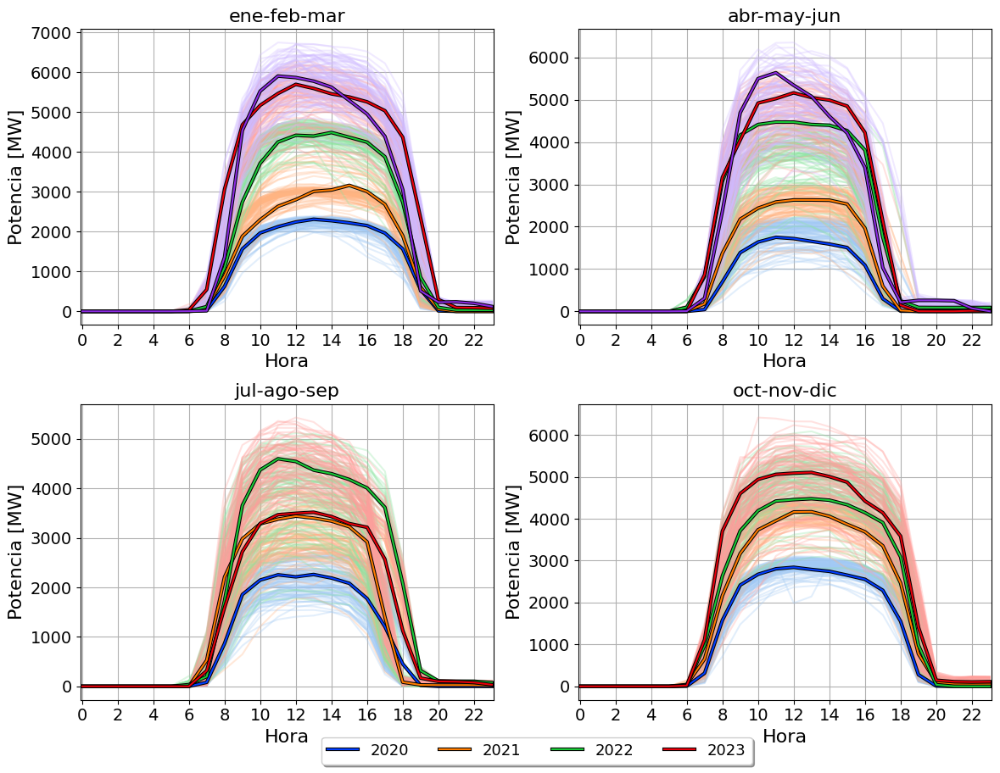

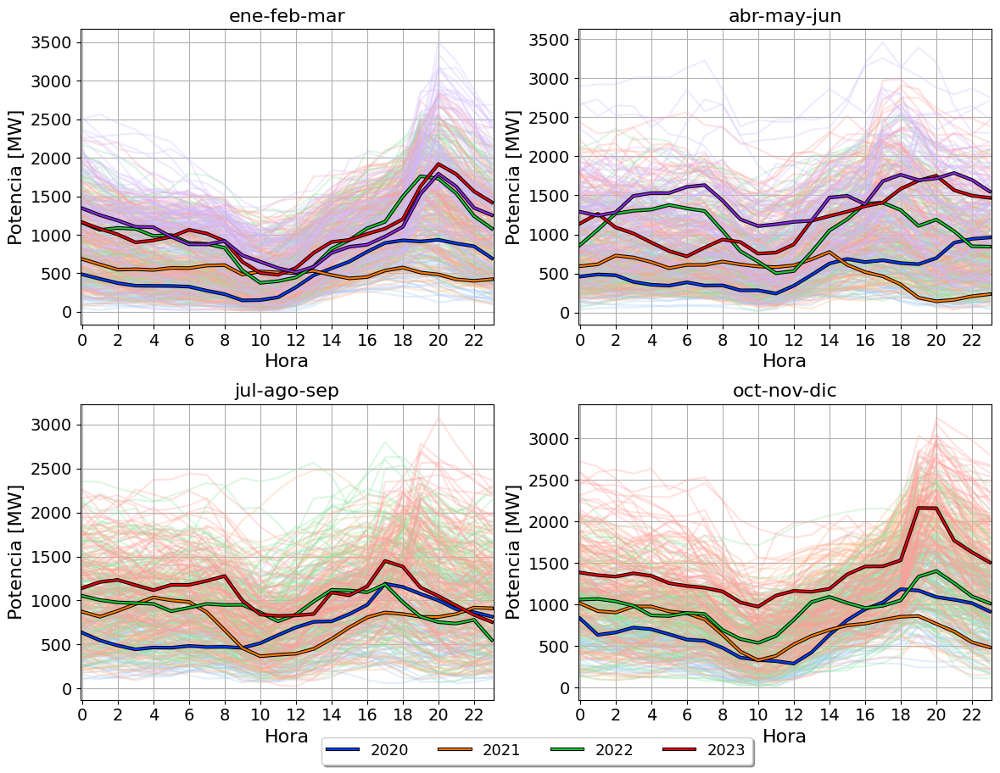

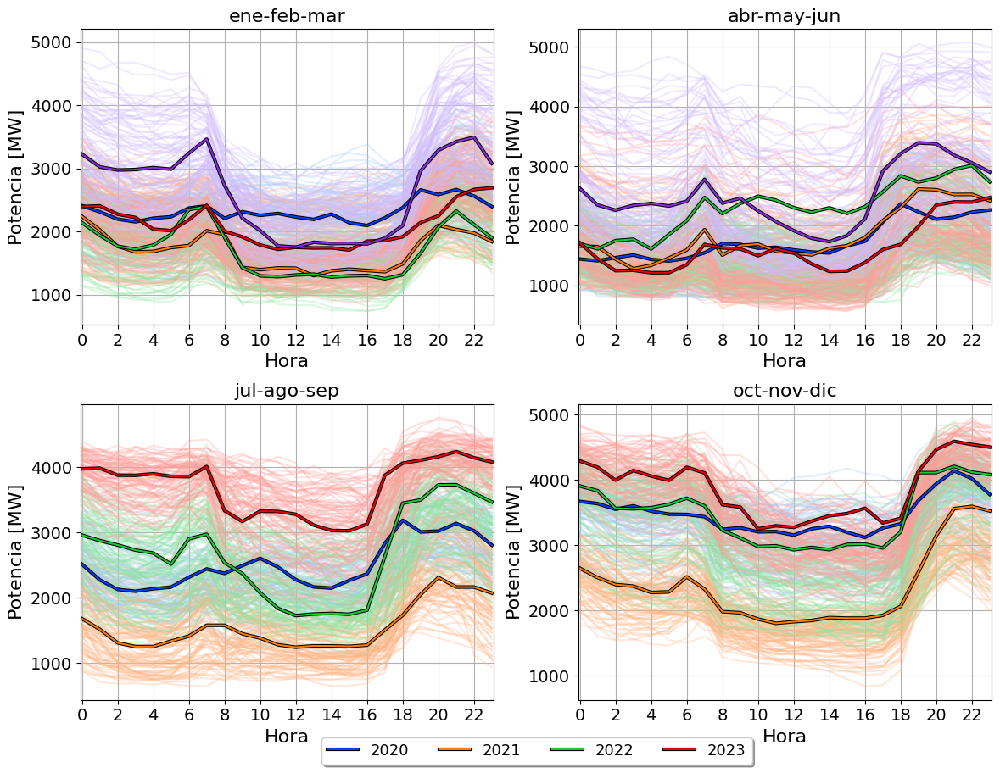

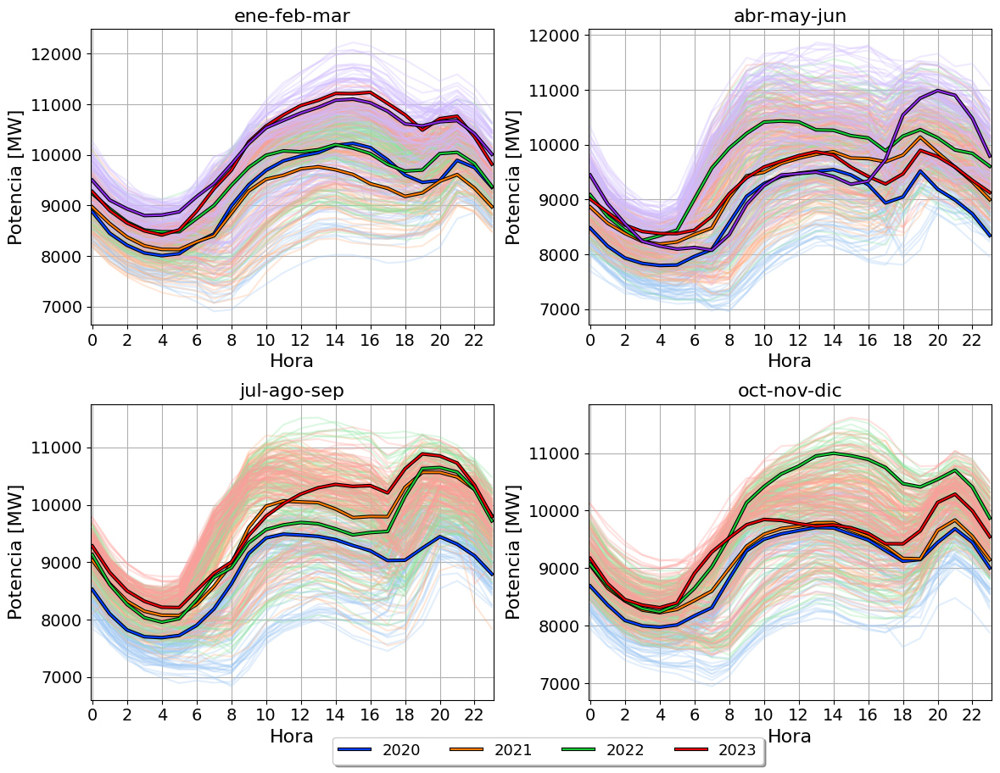

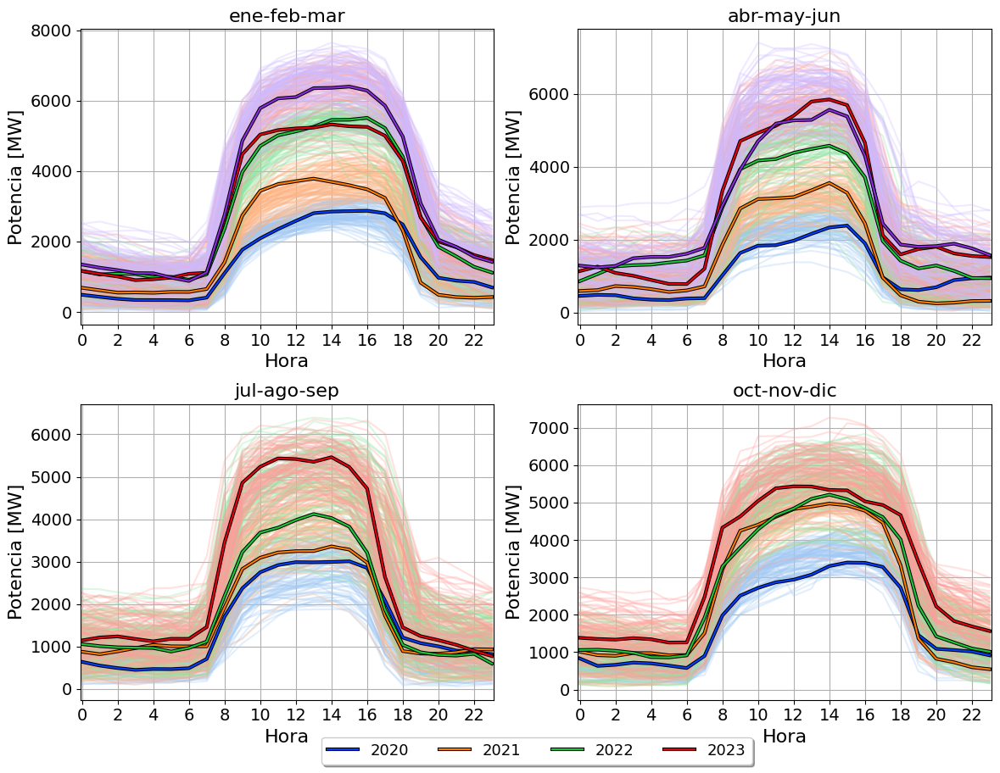

In [55]:
def plot_estacion(ax,df,title,pu,method,legend=False):

    # Definir un diccionario con los colores de cada año para las curvas claros
    paleta = "pastel"
    colors_year = dict()
    colors_year[2020] = sns.color_palette(paleta).as_hex()[0]
    colors_year[2021] = sns.color_palette(paleta).as_hex()[1]
    colors_year[2022] = sns.color_palette(paleta).as_hex()[2]
    colors_year[2023] = sns.color_palette(paleta).as_hex()[3]
    colors_year[2024] = sns.color_palette(paleta).as_hex()[4]

    # Los mismos colores pero más oscuros
    paleta = "bright"
    colors_year_means = dict()
    colors_year_means[2020] = sns.color_palette(paleta).as_hex()[0]
    colors_year_means[2021] = sns.color_palette(paleta).as_hex()[1]
    colors_year_means[2022] = sns.color_palette(paleta).as_hex()[2]
    colors_year_means[2023] = sns.color_palette(paleta).as_hex()[3]
    colors_year_means[2024] = sns.color_palette(paleta).as_hex()[4]

    for year in df.Year.unique():
        for month in df.Month.unique():
            df_Month = df[(df['Year']==year) & (df['Month']==month)]
            for day in df_Month.Day.unique():
                df_Day = df_Month[df_Month['Day']==day].reset_index(drop=True)
                ax.plot(df_Day.iloc[:,4],color=colors_year[year],alpha=0.3)
    
    for year in df.Year.unique():
        df_Year = df[df['Year']==year].reset_index(drop=True)

        if method == 'median':
            X = df_Year.iloc[:,4].values
            X = X.reshape(-1,24)

            # Get X as the centroid of K-median algorithm with k=1
            # Initialize the k-means object with k=1
            kmedians_instance = kmedians(X, [X[0]])
            kmedians_instance.process()
            clusters = kmedians_instance.get_clusters()
            Y = kmedians_instance.get_medians()[0]
        elif method == 'mean':
            df_mean = df_Year.groupby(['Hour']).mean().reset_index()
            Y = df_mean.iloc[:,4].values
        else:
            raise ValueError('method must be either "median" or "mean"')

        ax.plot(Y,color=colors_year_means[year],label=year, path_effects=[pe.Stroke(linewidth=3, foreground='k'), pe.Normal()])
    if legend:
        # legend outside the plot bottom
        ax.legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), shadow=True, ncol=5, fontsize=13)
    if pu:
        ax.set_ylabel('Potencia [pu]',fontsize=16)
    else:
        ax.set_ylabel('Potencia [MW]',fontsize=16)
    ax.set_xlabel('Hora',fontsize=16)
    ax.set_xlim([-0.1,23.1])
    ax.set_xticks(range(0,24,2))
    # change fontsize of ticks
    ax.tick_params(axis='both', which='major', labelsize=14)
    
    #plt.yticks(range(x,m, n))
    ax.grid()
    ax.set_title(title,fontsize=16)


def plot_estaciones(df,tech,save_path,pu=False,method='mean'):
    verano = df[df['Month'].isin([1,2,3])]
    otoño = df[df['Month'].isin([4,5,6])]
    invierno = df[df['Month'].isin([7,8,9])]
    primavera = df[df['Month'].isin([10,11,12])]

    fig, axs = plt.subplots(2,2, figsize=(12,9))
    if pu:
        titulo = f"Generación Horaria {tech} [pu]"
    else:
        titulo = f"Generación Horaria {tech} [MW]"
    #fig.suptitle(titulo, fontsize=16)
    plot_estacion(axs[0,0],verano,'ene-feb-mar',pu,method)
    plot_estacion(axs[0,1],otoño,'abr-may-jun',pu,method)
    plot_estacion(axs[1,0],invierno,'jul-ago-sep',pu,method)
    plt.tight_layout()
    plot_estacion(axs[1,1],primavera,'oct-nov-dic',pu,method,legend=True)

    
    save_file = os.path.join(save_path,f'GeneracionDiaria_{tech}.png')
    plt.savefig(save_file,dpi=400,bbox_inches='tight',format='png')


save_path = os.path.join(Figuras_dir,'Curvas Estaciones')
if not os.path.isdir(save_path): os.makedirs(save_path)

plot_estaciones(df_PotenciaSistema.loc[:,["Year","Month","Day","Hour","Solar"]], 'Solar Fotovoltaica',save_path, method='median')
plot_estaciones(df_PotenciaSistema.loc[:,["Year","Month","Day","Hour","Eolica"]], 'Eólica',save_path, method='median')
plot_estaciones(df_PotenciaSistema.loc[:,["Year","Month","Day","Hour","Hidro"]], 'Hidráulica',save_path, method='median')
#plot_estaciones(df_PotenciaSistema.loc[:,["Year","Month","Day","Hour","ERNC"]], 'ERNC',save_path, method='median')
plot_estaciones(df_PotenciaSistema.loc[:,["Year","Month","Day","Hour","Demanda"]], 'Demanda',save_path, method='median')
plot_estaciones(df_PotenciaSistema.loc[:,["Year","Month","Day","Hour","Sol_Eol"]], 'Solar + Eólica',save_path, method='median')

# Análisis de curvas:
Se observa una tendencia de aumento de generación el cual se puede atribuir al aumento de generación instalada

Esto sugiere que seria conveniente repetir el análisis pero normalizando por la potencia de generación instalada

In [56]:
df_CapacidadInst = pd.read_csv(os.path.join(Estudios_dir,'Output','CapacidadInstalada.csv'))

In [57]:
# Revisar que los meses y años de df_PotenciaSistema esten contenidos en df_CapacidadInst
# Obtener las tuplas Year-Month de df_CapInst
YearMonths_CapInst = []
for Year in df_CapacidadInst.Year.unique():
    df_Year_CapInst = df_CapacidadInst[df_CapacidadInst['Year'] == Year].reset_index(drop=True)
    for Month in df_Year_CapInst.Month.unique():
        YearMonths_CapInst.append((Year,Month))

# Obtener las tuplas Year-Month de df_PotenciaSistema
YearMonths_PotSistema = []
for Year in df_PotenciaSistema.Year.unique():
    df_Year_PotSistema = df_PotenciaSistema[df_PotenciaSistema['Year'] == Year].reset_index(drop=True)
    for Month in df_Year_PotSistema.Month.unique():
        YearMonths_PotSistema.append((Year,Month))

# Revision
YearMonths_faltantes = []
for YearMonth in YearMonths_PotSistema:
    Year_PotSist,Month_PotSist = YearMonth
    for Year_CapInst,Month_CapInst in YearMonths_CapInst:
        Esta = False
        if Year_PotSist == Year_CapInst and Month_PotSist == Month_CapInst:
            Esta = True
            break
    if not Esta:
        YearMonths_faltantes.append(YearMonth)

if len(YearMonths_faltantes) > 0:
    string = 'Faltan meses en df_CapacidadInst\n           Por favor agregar los meses:\n' 
    for YearMonth in YearMonths_faltantes:
        string += "             " + str(YearMonth) + '\n'
    raise Exception(string)


In [58]:
# Normalizar df_PotenciaSistema por la capacidad instalada para cada tecnologia

df_PotenciaSistema_norm = df_PotenciaSistema.copy(deep=True)

Tecnologias = ['Solar','Eolica','Hidro']

for Year in df_PotenciaSistema_norm.Year.unique():
    Months = df_PotenciaSistema_norm[df_PotenciaSistema_norm['Year'] == Year].Month.unique()
    for Month in Months:
        for tech in Tecnologias:
            CapInst = df_CapacidadInst[(df_CapacidadInst['Year'] == Year) & (df_CapacidadInst['Month'] == Month)][tech].values[0]
            df_PotenciaSistema_norm.loc[(df_PotenciaSistema_norm['Year'] == Year) & (df_PotenciaSistema_norm['Month'] == Month),tech] = df_PotenciaSistema_norm.loc[(df_PotenciaSistema_norm['Year'] == Year) & (df_PotenciaSistema_norm['Month'] == Month),tech]/CapInst

# Agregar una columna con la suma de las tecnologias normalizada que se llamara Sol_Eol_Hid
for Year in df_PotenciaSistema_norm.Year.unique():
    Months = df_PotenciaSistema_norm[df_PotenciaSistema_norm['Year'] == Year].Month.unique()
    for Month in Months:
        Pot_sol = df_PotenciaSistema.loc[(df_PotenciaSistema['Year'] == Year) & (df_PotenciaSistema['Month'] == Month),'Solar'].values
        Pot_eol = df_PotenciaSistema.loc[(df_PotenciaSistema['Year'] == Year) & (df_PotenciaSistema['Month'] == Month),'Eolica'].values
        Pot_hid = df_PotenciaSistema.loc[(df_PotenciaSistema['Year'] == Year) & (df_PotenciaSistema['Month'] == Month),'Hidro'].values

        Cap_sol = df_CapacidadInst[(df_CapacidadInst['Year'] == Year) & (df_CapacidadInst['Month'] == Month)]['Solar'].values[0]
        Cap_eol = df_CapacidadInst[(df_CapacidadInst['Year'] == Year) & (df_CapacidadInst['Month'] == Month)]['Eolica'].values[0]
        Cap_hid = df_CapacidadInst[(df_CapacidadInst['Year'] == Year) & (df_CapacidadInst['Month'] == Month)]['Hidro'].values[0]

        df_PotenciaSistema_norm.loc[(df_PotenciaSistema_norm['Year'] == Year) & (df_PotenciaSistema_norm['Month'] == Month),'Sol_Eol_Hid'] = (Pot_sol + Pot_eol + Pot_hid)/(Cap_sol + Cap_eol + Cap_hid)
        df_PotenciaSistema_norm.loc[(df_PotenciaSistema_norm['Year'] == Year) & (df_PotenciaSistema_norm['Month'] == Month),'Sol_Eol'] = (Pot_sol + Pot_eol)/(Cap_sol + Cap_eol)

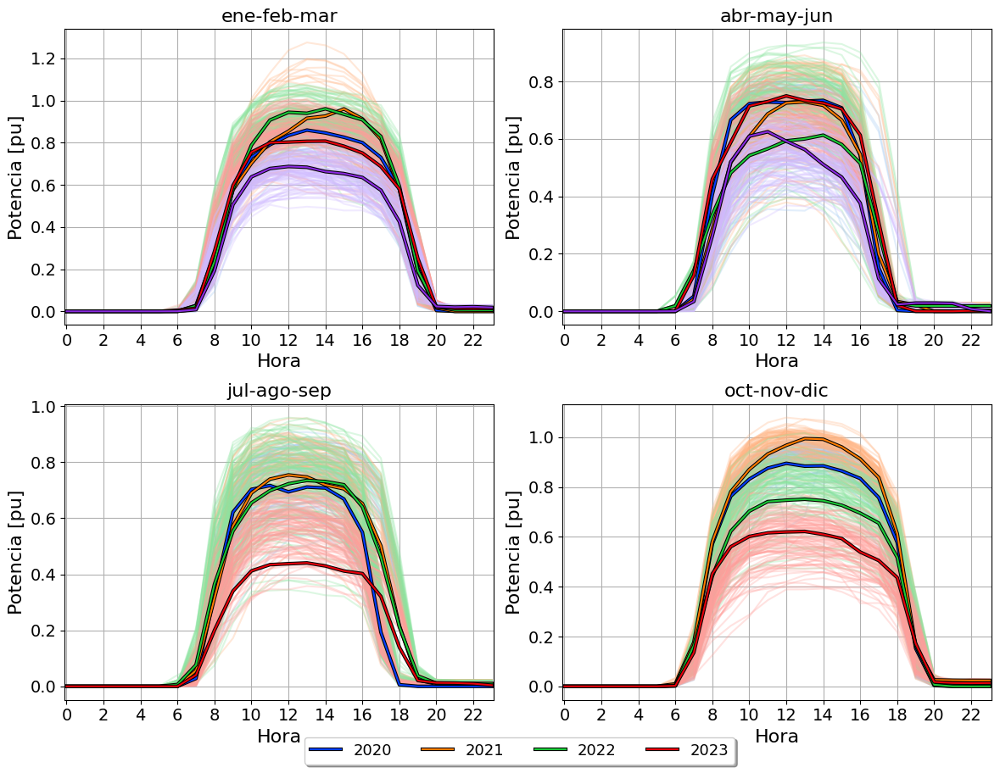

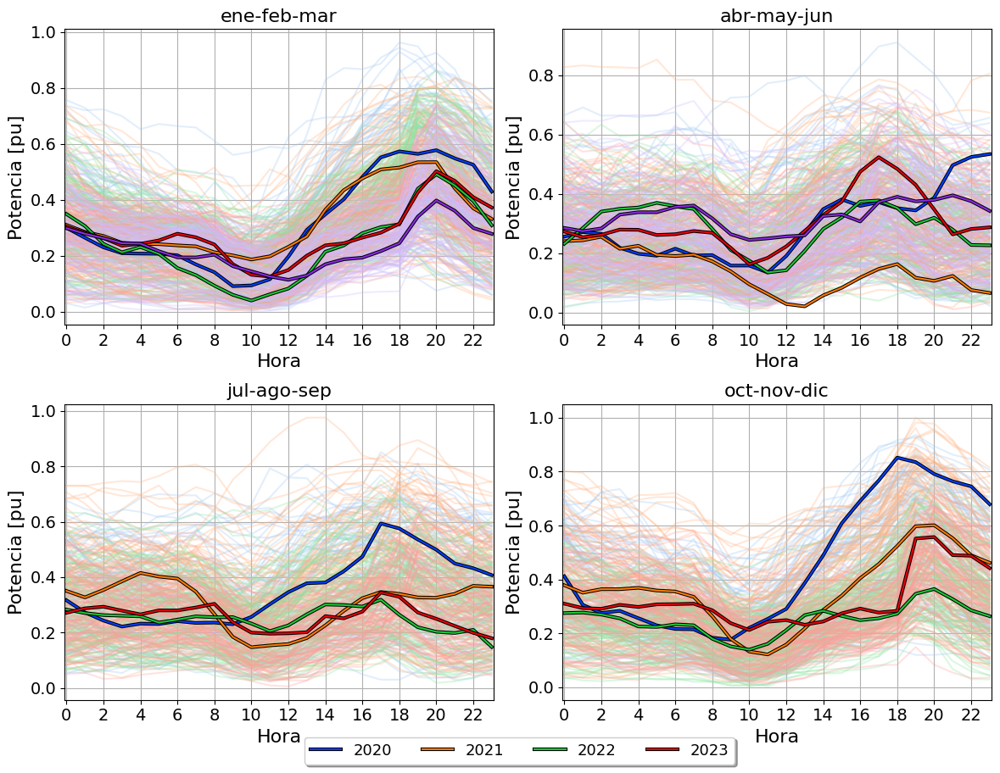

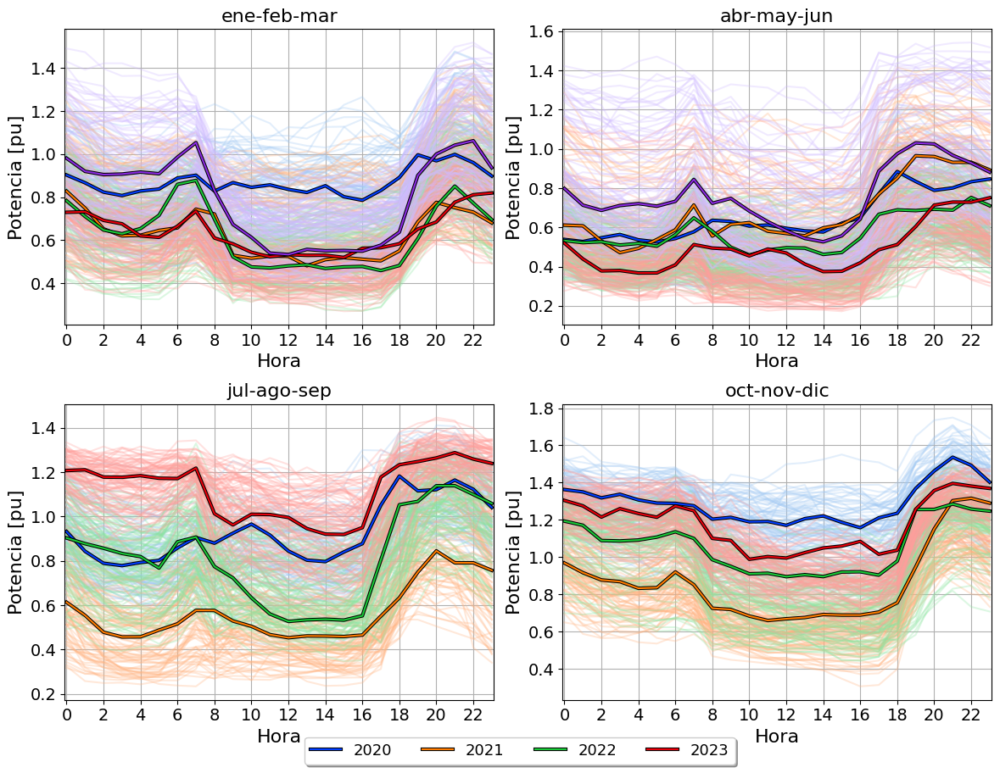

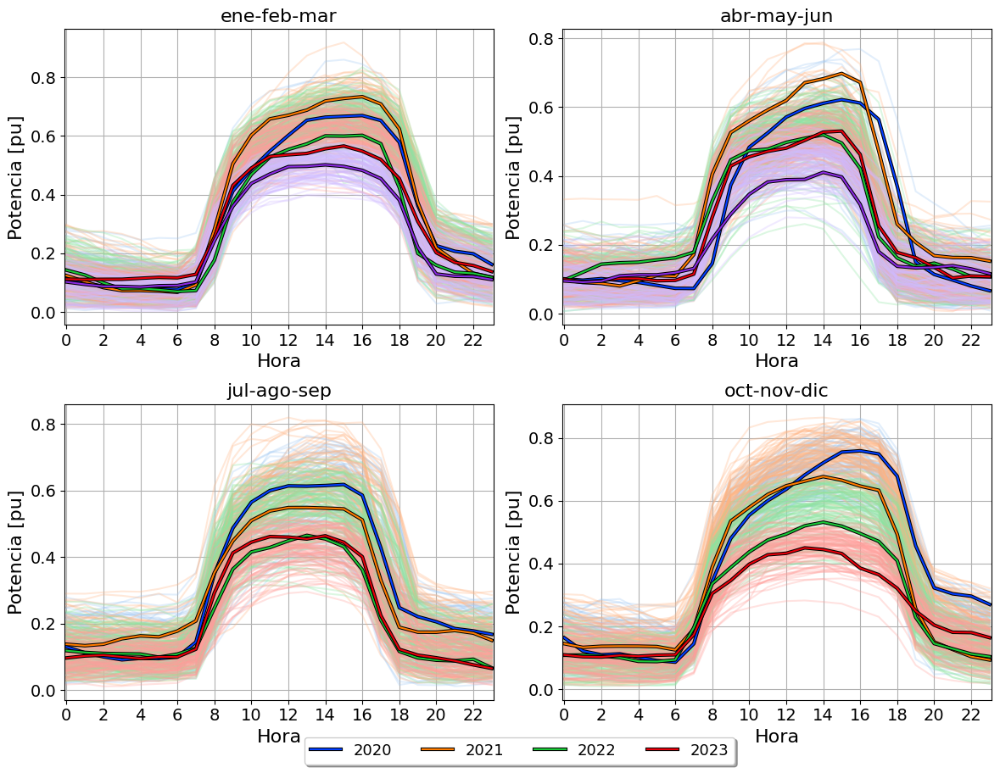

In [59]:
save_path = os.path.join(Figuras_dir,'Curvas Estaciones Normalizadas')
if not os.path.isdir(save_path): os.makedirs(save_path)

plot_estaciones(df_PotenciaSistema_norm.loc[:,["Year","Month","Day","Hour","Solar"]], 'Solar Fotovoltaica',save_path, method='median', pu=True)
plot_estaciones(df_PotenciaSistema_norm.loc[:,["Year","Month","Day","Hour","Eolica"]], 'Eólica',save_path, method='median', pu=True)
plot_estaciones(df_PotenciaSistema_norm.loc[:,["Year","Month","Day","Hour","Hidro"]], 'Hidráulica',save_path, method='median', pu=True)
#plot_estaciones(df_PotenciaSistema_norm.loc[:,["Year","Month","Day","Hour","Sol_Eol_Hid"]], 'Sol_Eol_Hid',save_path, method='median', pu=True)
plot_estaciones(df_PotenciaSistema_norm.loc[:,["Year","Month","Day","Hour","Sol_Eol"]], 'Solar + Eólica',save_path, method='median', pu=True)